# Load packages

In [1]:
# Loading the required packages to run this notebook
from src.visualisation.SummaryModels import SummaryModels
import src.utils.utils as utils
from src.visualisation.VisualiseTrajectories import VisualiseTrajectories
from src.data.Datasets import AISDiscreteRepresentation
from pathlib import Path
import pandas as pd

# Define the region to look into
region = "Bornholm"
zoom = 8
n = 6

In [2]:
# Use the SummaryModels class for everything related to the reconstructions
file_name = "RegionBornholm_01062019_30092019_FishCargTank_14400_86400_600"
summary_models = SummaryModels(file_name)

In [3]:
# Use the VisualiseTrajectories class for geographically visualising trajectories 
fig_size = (10, 10)
visualise_trajectories = VisualiseTrajectories(region, save_figures=True, plot_figures=True, fig_size=fig_size, zoom=zoom)
visualise_trajectories_discrete = VisualiseTrajectories(region, save_figures=True, plot_figures=True, fig_size=fig_size,
                                                        zoom=zoom, continuous_representation=False)
processed_data_dir =  visualise_trajectories.processed_data_dir

# Read the info file to know how to read the data file
data_infos = utils.construct_read_data_info_file(file_name, processed_data_dir)

# Load the static Google Map image for the RIO
img = visualise_trajectories.read_static_map()

In [4]:
# Function that plots the actual and reconstructed side by side
def plot_actual_reconstructed(idx):
    # Setup for the plotting
    fig_size_tmp = visualise_trajectories_discrete.fig_size
    visualise_trajectories_discrete.fig_size = (20,10)
    fig, ax = visualise_trajectories_discrete.visualise_static_map(img, subplots=[1, 2])
    plot_figures_tmp = visualise_trajectories_discrete.plot_figures
    visualise_trajectories_discrete.plot_figures = False
        
    # For plotting a single complete vessel trajectory on the static map - Discrete representation
    index = df_n.iloc[idx]["Index"]
    data_set = AISDiscreteRepresentation(file_name, data_info=data_info, indicies=[index])
    df_actual = utils.get_tracks_from_dataset(data_set, continuous_representation=False)
    
    # For plotting the corresponding model reconstruction
    index = df_n.iloc[idx]["Data set Index"]
    data_set = train_evaluate.validation_dataloader.dataset
    reconstruction = train_evaluate.track_reconstructions(data_set, index)
    df_recon = reconstruction["Reconstruction"][1:]
    
    # Setup actual and reconstruction data frames
    df_speed = utils.concat_actual_recon(df_actual, df_recon, "Speed")
    df_course = utils.concat_actual_recon(df_actual, df_recon, "Course")
    df_speed["Type"] = df_speed["Type"].str.replace("Actual", "Actual speed")
    df_course["Type"] = df_course["Type"].str.replace("Actual", "Actual course")
    
    # Do the actual plotting
    visualise_trajectories_discrete.plot_single_track(df_actual, ax[0], use_cmap=True, df_speed=df_speed,
                                                      df_course=df_course, fig=fig, rect=[0.15, 0.72, 0.12, 0.12], 
                                                      rect2=[0.575, 0.72, 0.12, 0.12])
    visualise_trajectories_discrete.plot_figures = plot_figures_tmp
    visualise_trajectories_discrete.plot_single_track(df_recon, ax[1], use_cmap=True)
    visualise_trajectories_discrete.fig_size = fig_size_tmp
    return {"Actual trajectory": df_actual, "Reconstructed trajectory": df_recon,
            "Speed data frame": df_speed, "Course data frame": df_course}

# Best Fishing Reconstructions

C:\Github\vessel-trajectory-anomaly-detection\models\saved-models\VRNN_RegionBornholm_01062019_30092019_FishCargTank_14400_86400_600_latent100_recurrent100_batchNormFalse.pth


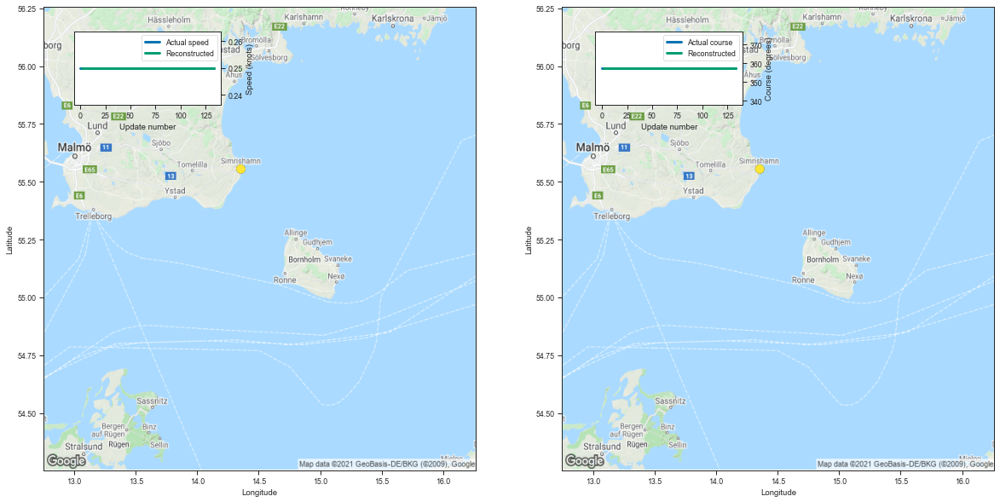

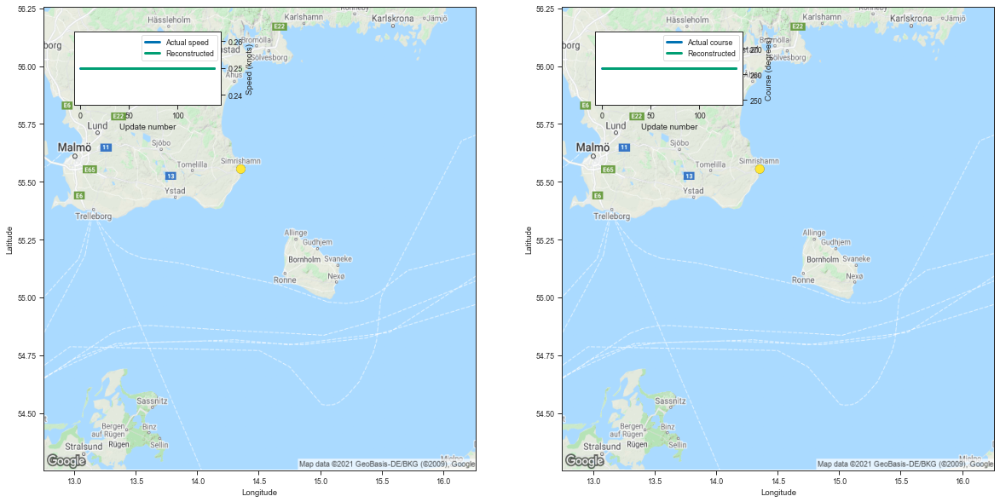

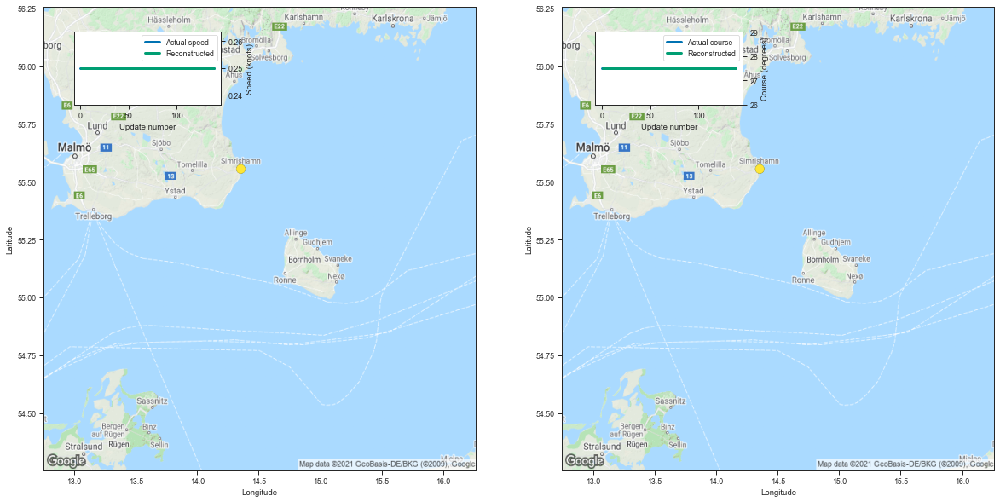

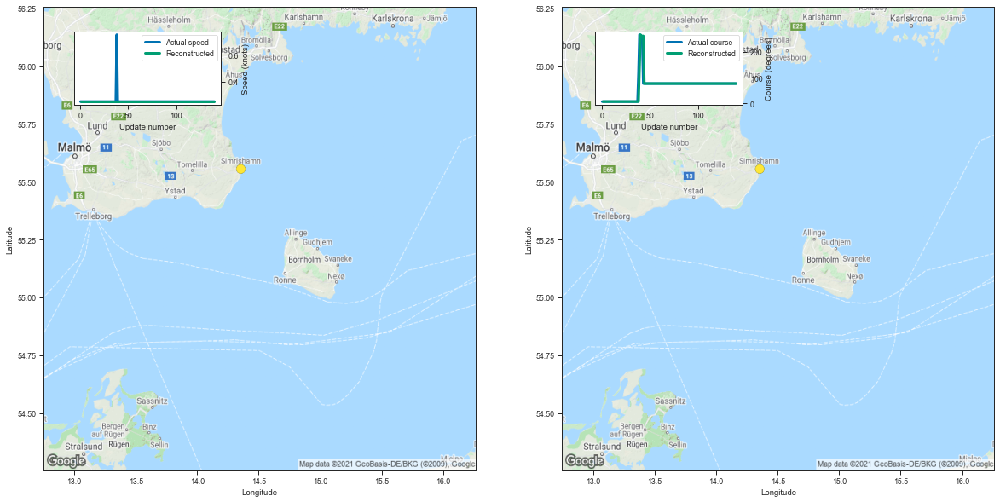

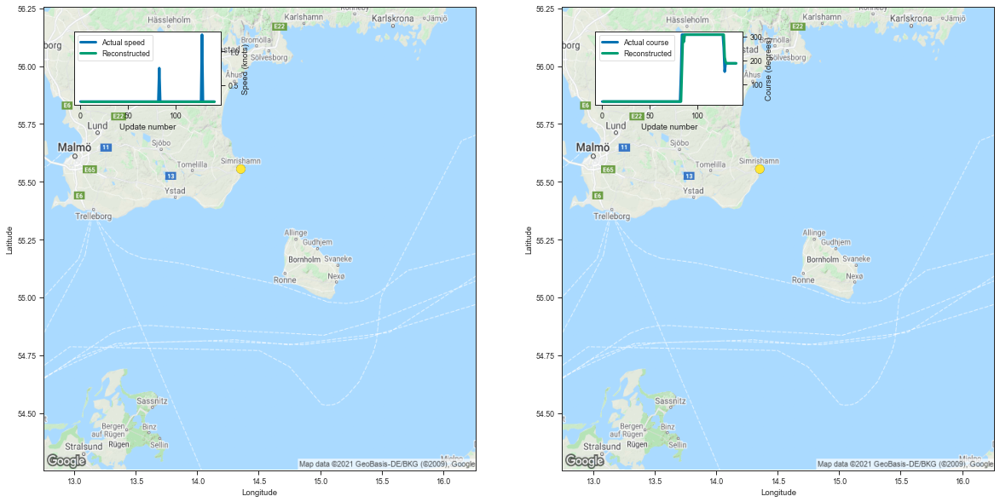

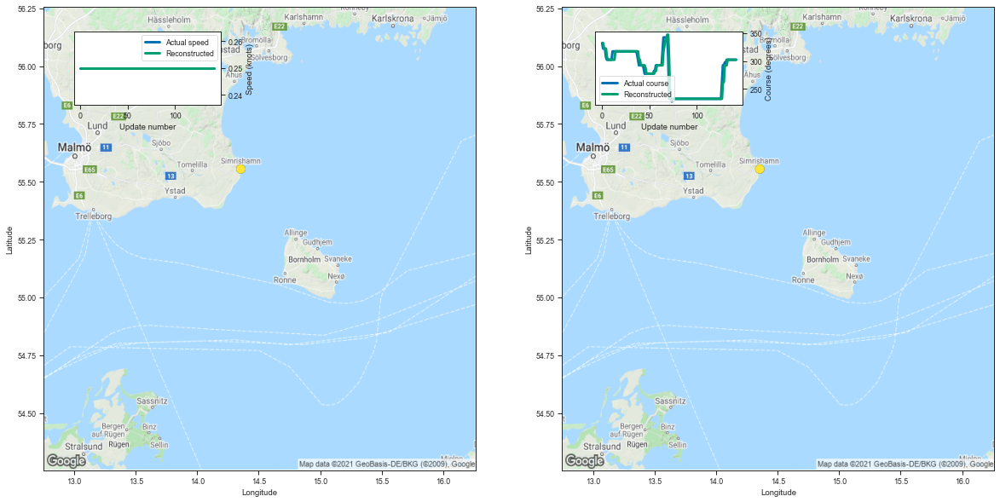

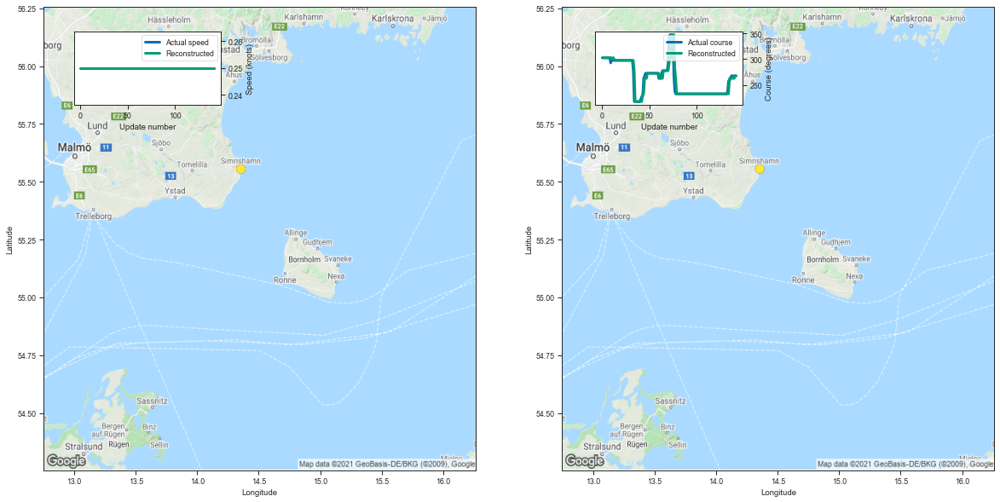

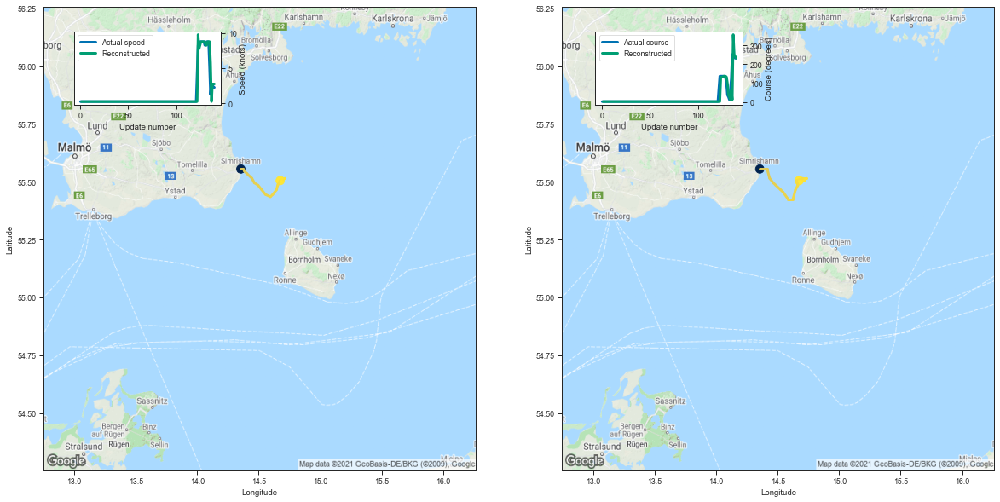

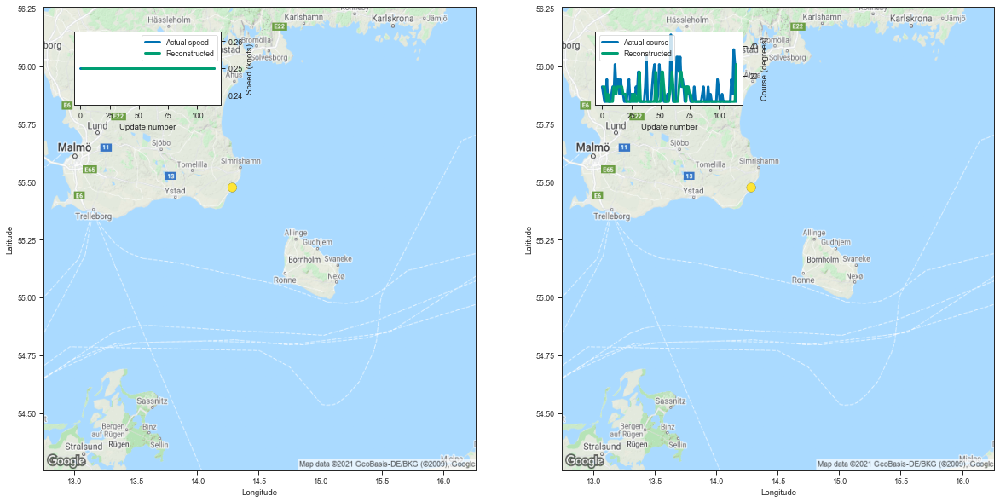

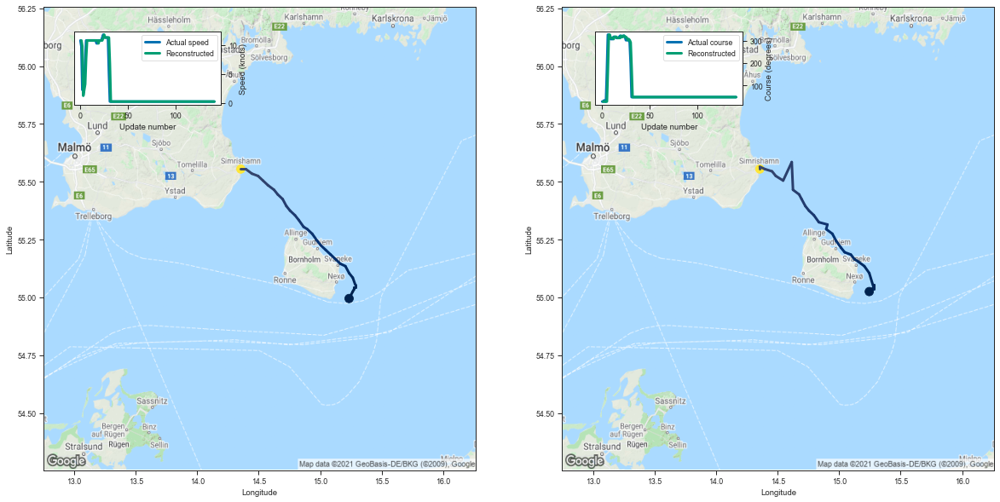

,Data set Index,Index,MMSI,Ship type,Length,Reconstruction log probability,Equally weighted reconstruction log probability
100,100,1583421,219021428,Fishing,135,-23.565094,-0.174556
43,43,5760657,265750000,Fishing,139,-29.610538,-0.213025
52,52,5635000,265750000,Fishing,140,-57.360542,-0.409718
85,85,6525750,265755000,Fishing,141,-105.592812,-0.748885
76,76,5480216,265750000,Fishing,142,-207.730835,-1.462893
42,42,5972813,265754000,Fishing,143,-228.598892,-1.598594
103,103,6064863,265754000,Fishing,143,-275.110840,-1.923852
11,11,6489434,265755000,Fishing,141,-336.136169,-2.383944
57,57,4868710,265551874,Fishing,116,-314.494843,-2.711162
23,23,5544210,265750000,Fishing,142,-404.742371,-2.850298


In [6]:
# Focus on the n best fishing reconstructions
vessel_type = "Fishing"
data_info = data_infos[vessel_type]
data = summary_models.run_evaluation_get_n(n=10, worst=False, vessel_type=vessel_type)
df_n = data["TrajectoryLevelData"]
train_evaluate = data["TrainEvaluateObject"]
data_set_i = 1 if vessel_type == "Cargo" else 0
data_set = train_evaluate.validation_dataloader.dataset.datasets[data_set_i]

# Plot the actual and reconstructed trajectories side by side
for idx in range(10): 
    tracks = plot_actual_reconstructed(idx)
df_n

# Worst Fishing Reconstructions

C:\Github\vessel-trajectory-anomaly-detection\models\saved-models\VRNN_RegionBornholm_01062019_30092019_FishCargTank_14400_86400_600_latent100_recurrent100_batchNormFalse.pth


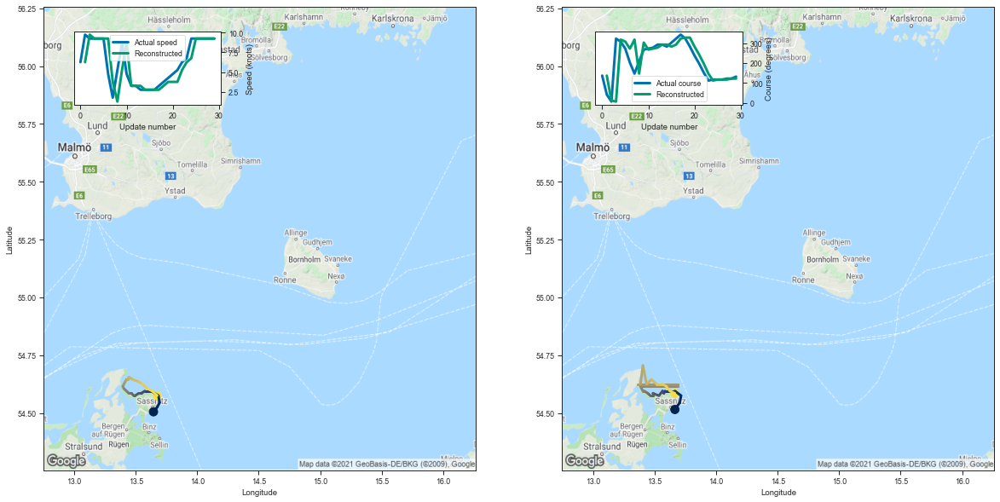

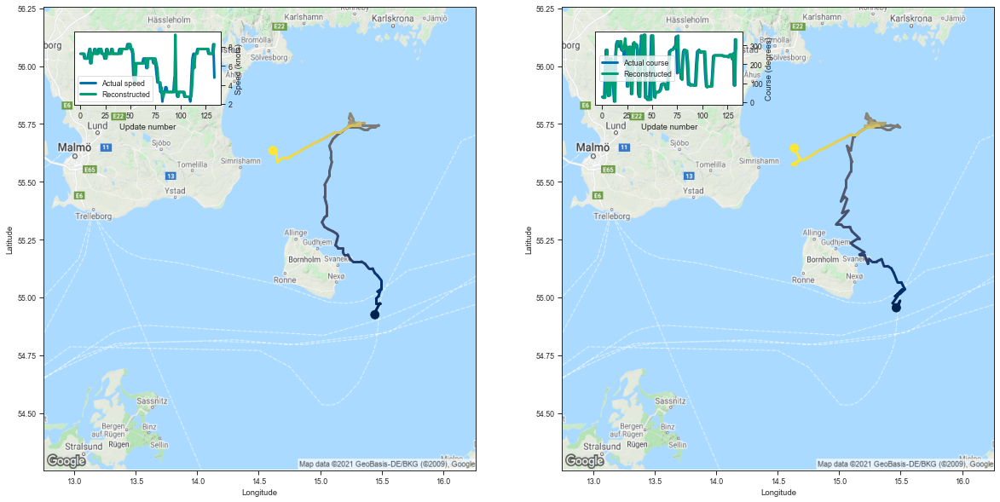

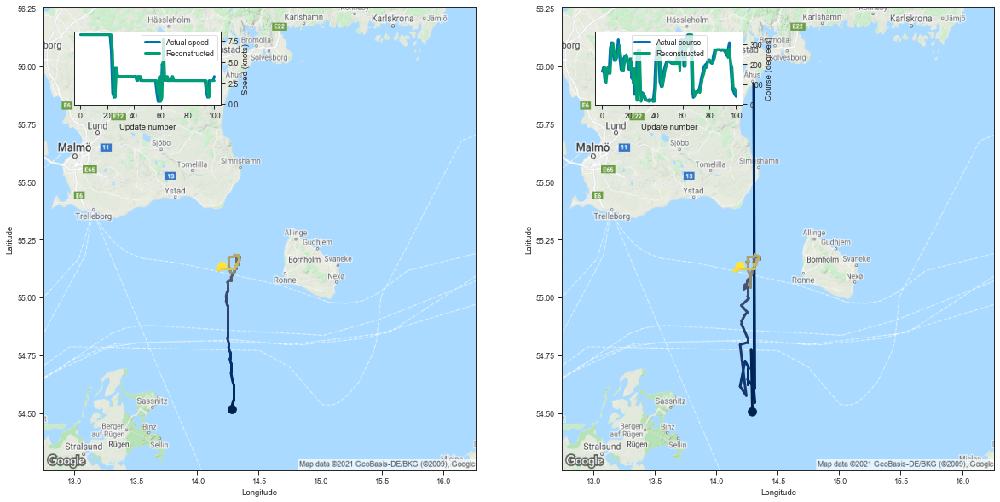

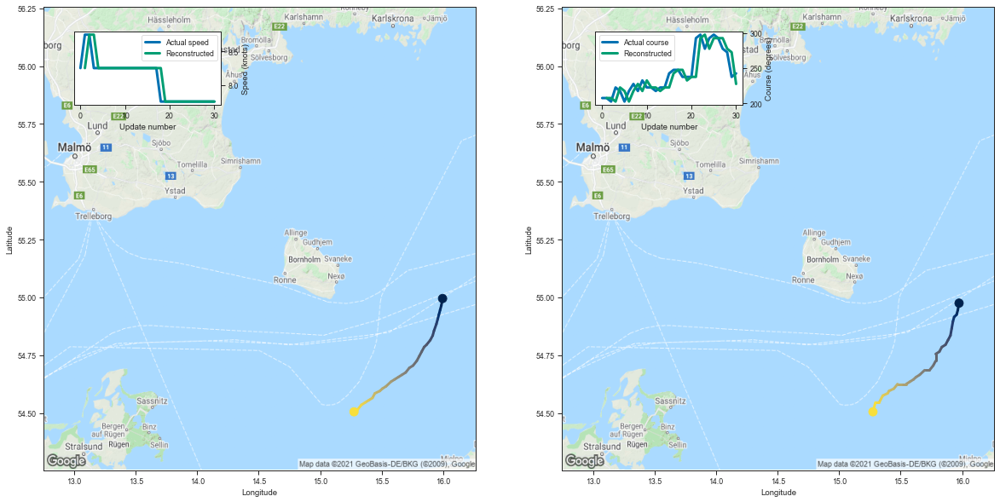

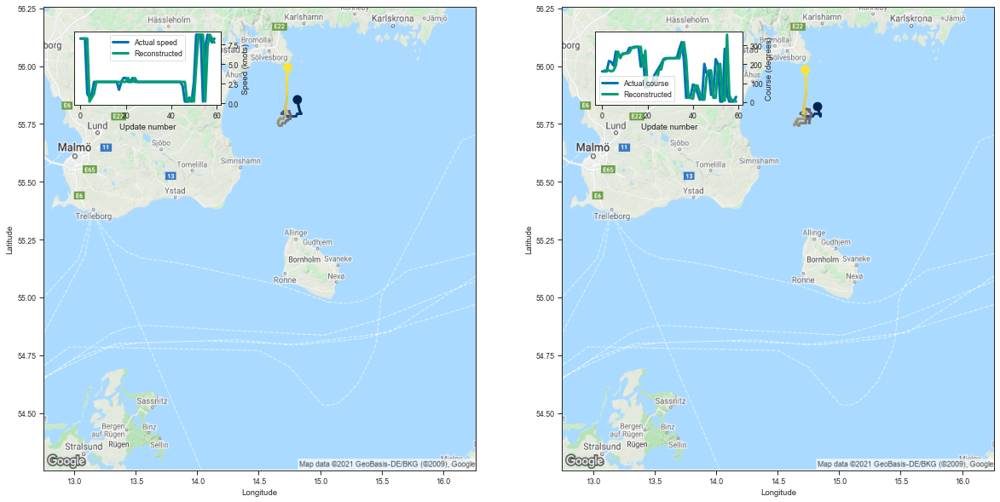

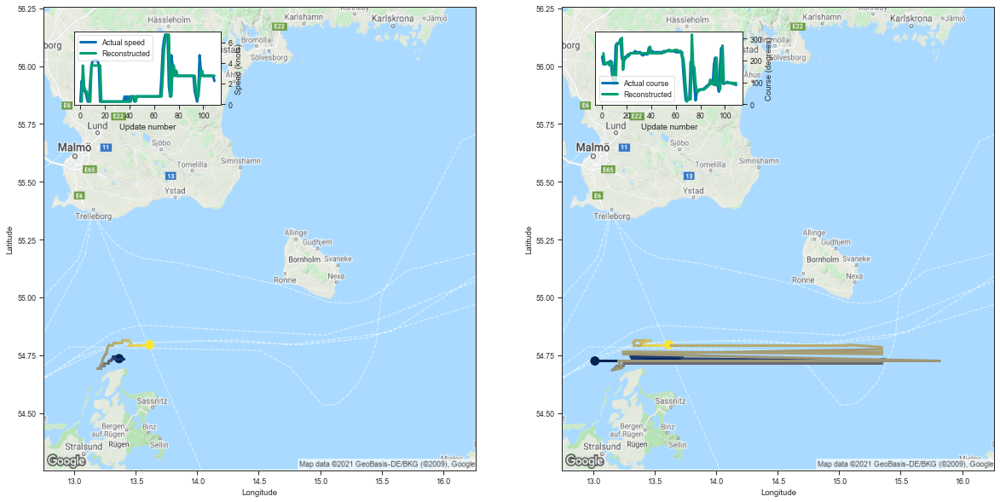

,Data set Index,Index,MMSI,Ship type,Length,Reconstruction log probability,Equally weighted reconstruction log probability
73,73,1113112,211542610,Fishing,30,-465.459564,-15.515319
49,49,1557318,219021428,Fishing,135,-1990.010376,-14.740818
48,48,4303656,261007170,Fishing,101,-1432.511230,-14.183280
1,1,4547326,261061000,Fishing,31,-419.785675,-13.541473
63,63,7579789,266315000,Fishing,60,-721.624023,-12.027067
21,21,19488,211243240,Fishing,110,-1310.000488,-11.909095


In [9]:
# Focus on the n worst fishing reconstructions
data = summary_models.run_evaluation_get_n(n=n, worst=True, vessel_type=vessel_type)
df_n = data["TrajectoryLevelData"]
train_evaluate = data["TrainEvaluateObject"]
data_set = train_evaluate.validation_dataloader.dataset.datasets[data_set_i]

# Plot the actual and reconstructed trajectories side by side
for idx in range(n): 
    tracks = plot_actual_reconstructed(idx)
df_n

# Worst n=25 fishing Reconstructions

C:\Github\vessel-trajectory-anomaly-detection\models\saved-models\VRNN_RegionBornholm_01062019_30092019_FishCargTank_14400_86400_600_latent100_recurrent100_batchNormFalse.pth


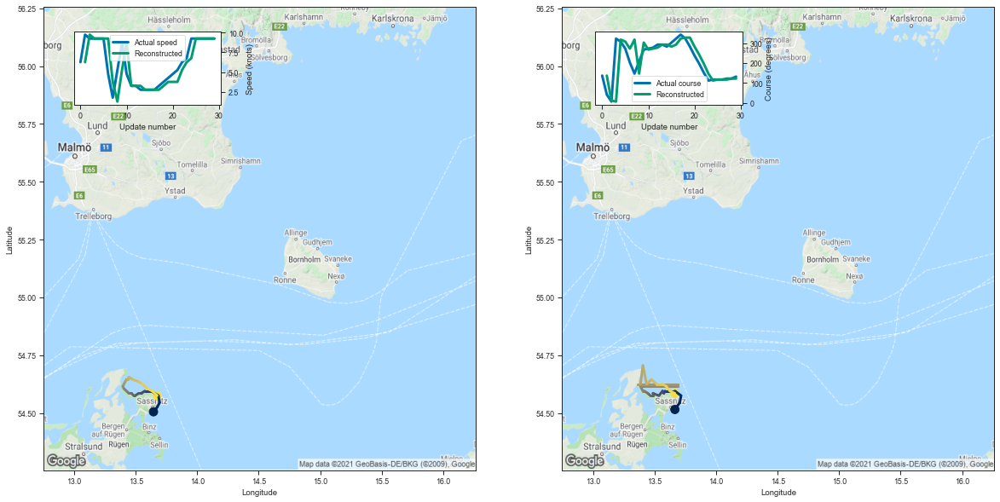

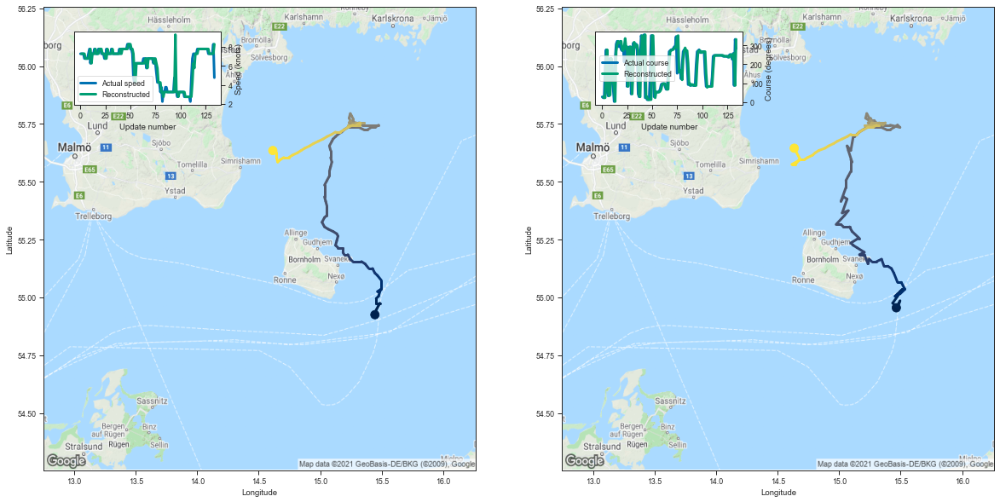

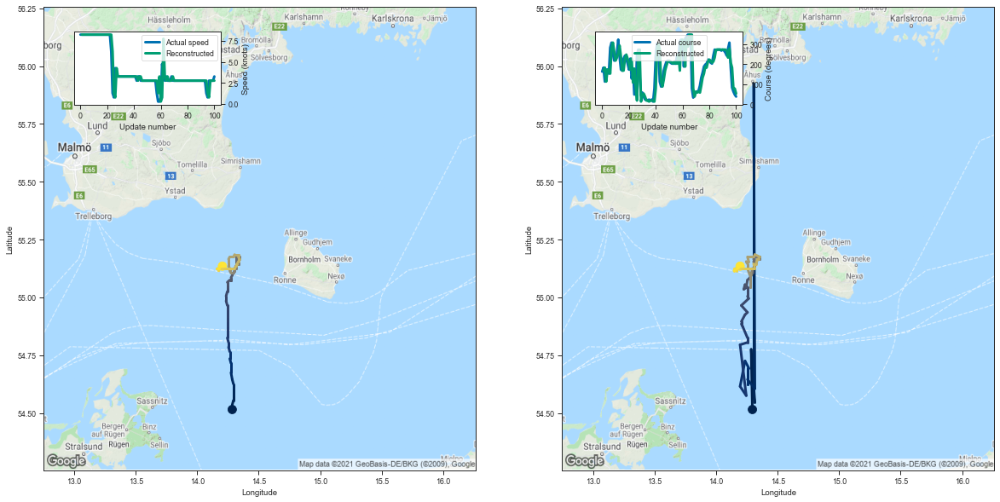

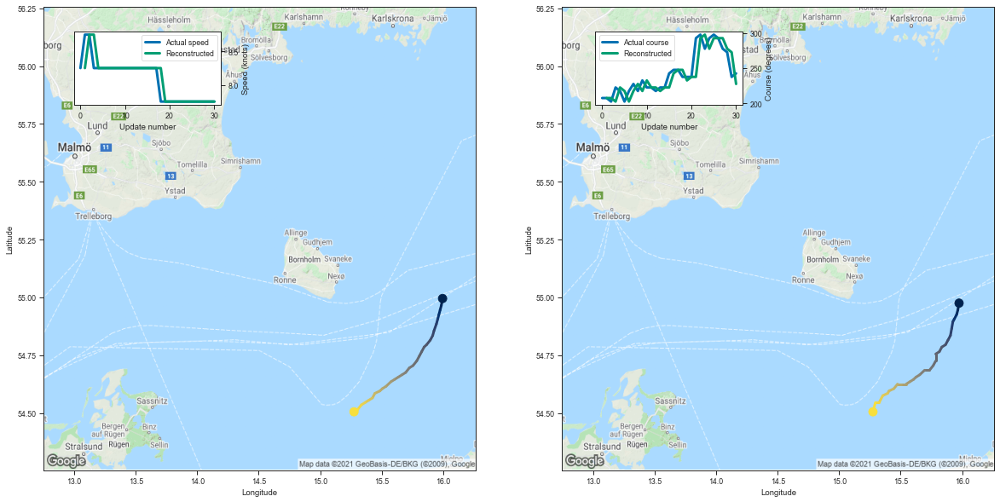

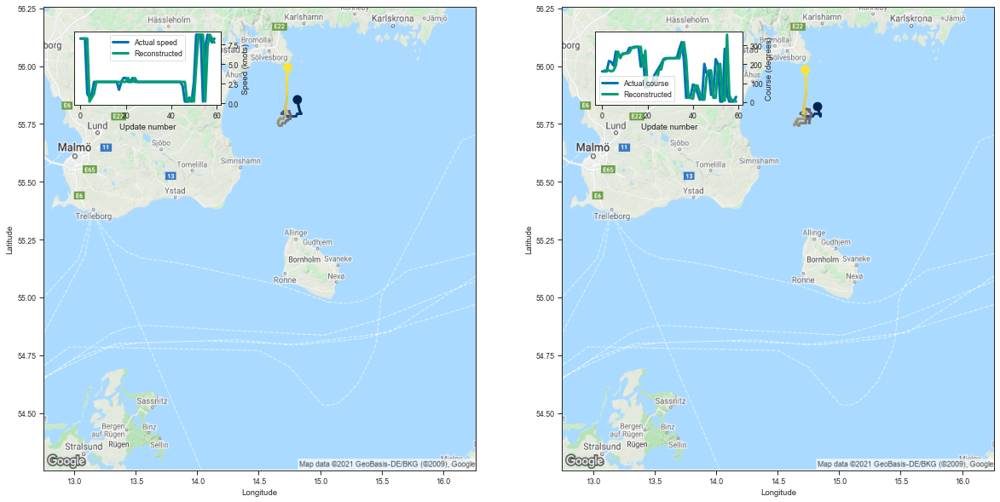

...

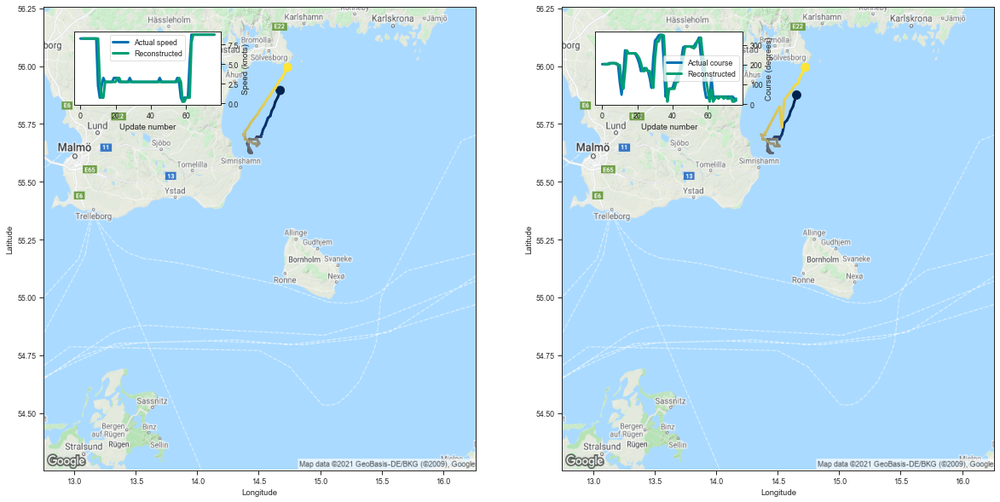

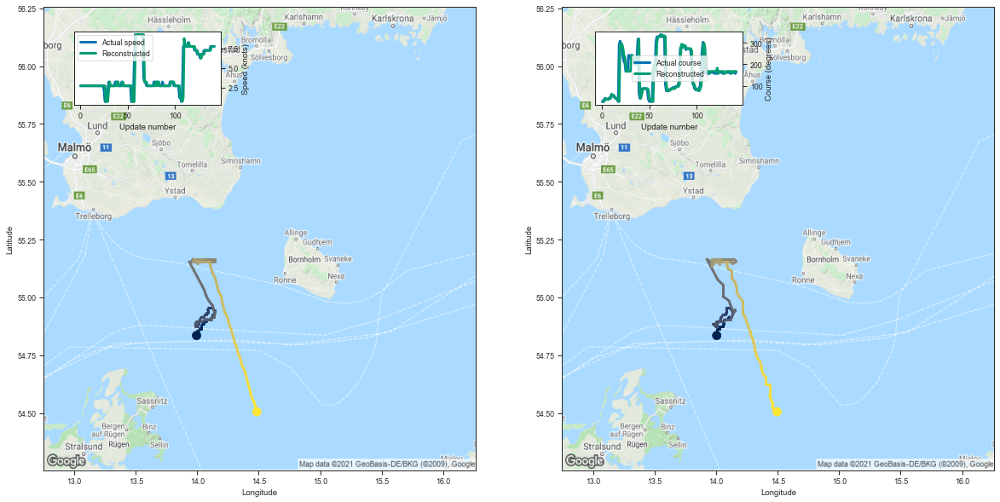

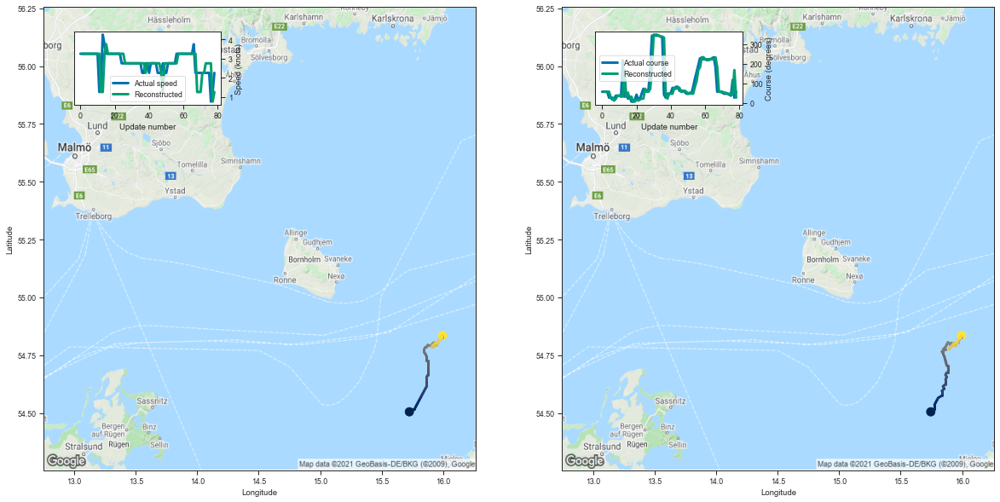

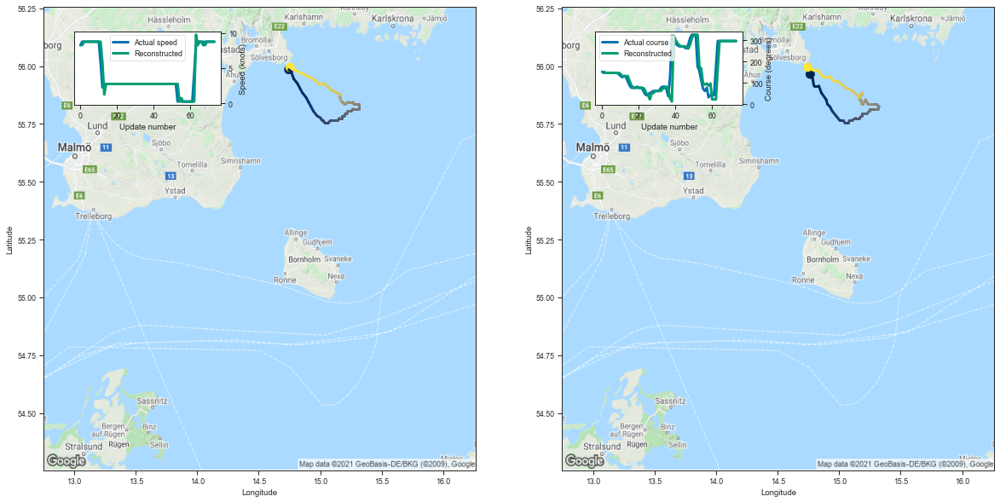

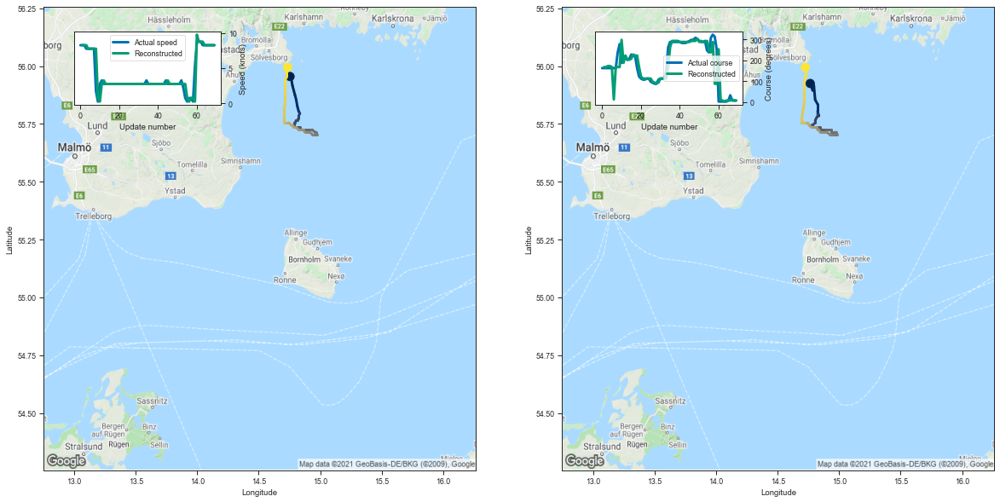

,Data set Index,Index,MMSI,Ship type,Length,Reconstruction log probability,Equally weighted reconstruction log probability
73,73,1113112,211542610,Fishing,30,-464.035400,-15.467847
49,49,1557318,219021428,Fishing,135,-1989.236572,-14.735086
48,48,4303656,261007170,Fishing,101,-1432.229980,-14.180495
1,1,4547326,261061000,Fishing,31,-417.949982,-13.482257
63,63,7579789,266315000,Fishing,60,-723.389465,-12.056491
21,21,19488,211243240,Fishing,110,-1311.586304,-11.923512
38,38,4942336,265593190,Fishing,58,-681.273499,-11.746095
91,91,5598936,265750000,Fishing,140,-1554.394653,-11.102819
5,5,6496,211215500,Fishing,100,-1089.739990,-10.897400
30,30,1149722,211551270,Fishing,107,-1142.172852,-10.674513


In [8]:
# Focus on the n=25 worst fishing reconstructions
data = summary_models.run_evaluation_get_n(n=25, worst=True, vessel_type=vessel_type)
df_n = data["TrajectoryLevelData"]
train_evaluate = data["TrainEvaluateObject"]
data_set = train_evaluate.validation_dataloader.dataset.datasets[data_set_i]

# Plot the actual and reconstructed trajectories side by side
for idx in range(25): 
    tracks = plot_actual_reconstructed(idx)
df_n